# STEP 1: Import Libraries 

In [1]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
import warnings 
warnings.filterwarnings(action='ignore')

# STEP 2: Loading the dataset

In [2]:
df = pd.read_csv('audible_uncleaned.csv')

# STEP 3: Initial Data Inspection

In [3]:
print("First five rows of the dataset:")
df.head()

First five rows of the dataset:


,name,author,narrator,time,releasedate,language,stars,price
0,Geronimo Stilton #11 & #12,Writtenby:GeronimoStilton,Narratedby:BillLobely,2 hrs and 20 mins,04-08-08,English,5 out of 5 stars34 ratings,468.00
1,The Burning Maze,Writtenby:RickRiordan,Narratedby:RobbieDaymond,13 hrs and 8 mins,01-05-18,English,4.5 out of 5 stars41 ratings,820.00
2,The Deep End,Writtenby:JeffKinney,Narratedby:DanRussell,2 hrs and 3 mins,06-11-20,English,4.5 out of 5 stars38 ratings,410.00
3,Daughter of the Deep,Writtenby:RickRiordan,Narratedby:SoneelaNankani,11 hrs and 16 mins,05-10-21,English,4.5 out of 5 stars12 ratings,615.00
4,"The Lightning Thief: Percy Jackson, Book 1",Writtenby:RickRiordan,Narratedby:JesseBernstein,10 hrs,13-01-10,English,4.5 out of 5 stars181 ratings,820.00


In [4]:
print("\nDataset info:")

df.info()


Dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87489 entries, 0 to 87488
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   name         87489 non-null  object
 1   author       87489 non-null  object
 2   narrator     87489 non-null  object
 3   time         87489 non-null  object
 4   releasedate  87489 non-null  object
 5   language     87489 non-null  object
 6   stars        87489 non-null  object
 7   price        87489 non-null  object
dtypes: object(8)
memory usage: 5.3+ MB


# STEP 4: Checking for Missing Values

In [5]:
print("\nMissing values per column:")
print(df.isnull().sum())


Missing values per column:
name           0
author         0
narrator       0
time           0
releasedate    0
language       0
stars          0
price          0
dtype: int64


# STEP 5: Checking columns 

In [6]:
df.head(5)

,name,author,narrator,time,releasedate,language,stars,price
0,Geronimo Stilton #11 & #12,Writtenby:GeronimoStilton,Narratedby:BillLobely,2 hrs and 20 mins,04-08-08,English,5 out of 5 stars34 ratings,468.00
1,The Burning Maze,Writtenby:RickRiordan,Narratedby:RobbieDaymond,13 hrs and 8 mins,01-05-18,English,4.5 out of 5 stars41 ratings,820.00
2,The Deep End,Writtenby:JeffKinney,Narratedby:DanRussell,2 hrs and 3 mins,06-11-20,English,4.5 out of 5 stars38 ratings,410.00
3,Daughter of the Deep,Writtenby:RickRiordan,Narratedby:SoneelaNankani,11 hrs and 16 mins,05-10-21,English,4.5 out of 5 stars12 ratings,615.00
4,"The Lightning Thief: Percy Jackson, Book 1",Writtenby:RickRiordan,Narratedby:JesseBernstein,10 hrs,13-01-10,English,4.5 out of 5 stars181 ratings,820.00


# STEP 6: Clear the column author (delete Written by) #

In [7]:
df['author'] = df['author'].str.replace('Writtenby:', '', regex=False)

In [8]:
df['author']

0        GeronimoStilton
1            RickRiordan
2             JeffKinney
3            RickRiordan
4            RickRiordan
              ...       
87484       ChrisStewart
87485      StephenO'Shea
87486          MarkTwain
87487     LaurenceSterne
87488      MarkKurlansky
Name: author, Length: 87489, dtype: object

# STEP 7: Split the column author --> first & last name #

In [9]:
def split_names(name):
    # Find all uppercase letters in the name
    uppercase_indices = [i for i, char in enumerate(name) if char.isupper()]
    
    # Check if there are at least two uppercase letters
    if len(uppercase_indices) >= 2:
        # Split the name at the second uppercase letter
        second_upper_index = uppercase_indices[1]
        first_name = name[:second_upper_index]
        last_name = name[second_upper_index:]
        return first_name, last_name
    else:
        # Handle cases where the string doesn't have two uppercase letters
        return name, None

# Example usage

name = "GeronimoStilton"
first_name, last_name = split_names(name)

print("First Name:", first_name)
print("Last Name:", last_name)

First Name: Geronimo
Last Name: Stilton


In [10]:
df[['author_first_name', 'author_last_name']] = df['author'].apply(lambda x: pd.Series(split_names(x)))

In [11]:
df.head(3)

,name,author,narrator,time,releasedate,language,stars,price,author_first_name,author_last_name
0,Geronimo Stilton #11 & #12,GeronimoStilton,Narratedby:BillLobely,2 hrs and 20 mins,04-08-08,English,5 out of 5 stars34 ratings,468.00,Geronimo,Stilton
1,The Burning Maze,RickRiordan,Narratedby:RobbieDaymond,13 hrs and 8 mins,01-05-18,English,4.5 out of 5 stars41 ratings,820.00,Rick,Riordan
2,The Deep End,JeffKinney,Narratedby:DanRussell,2 hrs and 3 mins,06-11-20,English,4.5 out of 5 stars38 ratings,410.00,Jeff,Kinney


# STEP 8: Clear the column narrator (delete Narrated by) #

In [12]:
df['narrator'] = df['narrator'].str.replace('Narratedby:', '', regex=False)

In [13]:
df['narrator']

0            BillLobely
1         RobbieDaymond
2            DanRussell
3        SoneelaNankani
4        JesseBernstein
              ...      
87484      ChrisStewart
87485        RobertFass
87486         FloGibson
87487       AntonLesser
87488       FleetCooper
Name: narrator, Length: 87489, dtype: object

# STEP 9: Create two columns with 1.narrator's first_name , 2.narrator's last_name #

In [14]:
df[['narrator_first_name', 'narrator_last_name']] = df['narrator'].apply(lambda x: pd.Series(split_names(x)))

In [15]:
df.head(3)

,name,author,narrator,time,releasedate,language,stars,price,author_first_name,author_last_name,narrator_first_name,narrator_last_name
0,Geronimo Stilton #11 & #12,GeronimoStilton,BillLobely,2 hrs and 20 mins,04-08-08,English,5 out of 5 stars34 ratings,468.00,Geronimo,Stilton,Bill,Lobely
1,The Burning Maze,RickRiordan,RobbieDaymond,13 hrs and 8 mins,01-05-18,English,4.5 out of 5 stars41 ratings,820.00,Rick,Riordan,Robbie,Daymond
2,The Deep End,JeffKinney,DanRussell,2 hrs and 3 mins,06-11-20,English,4.5 out of 5 stars38 ratings,410.00,Jeff,Kinney,Dan,Russell


# STEP 10: Checking column stars #

In [16]:
df['stars'].value_counts()

stars
Not rated yet                    72417
5 out of 5 stars1 rating          3739
4 out of 5 stars1 rating          1254
5 out of 5 stars2 ratings          998
4.5 out of 5 stars2 ratings        661
                                 ...  
3.5 out of 5 stars61 ratings         1
5 out of 5 stars321 ratings          1
5 out of 5 stars93 ratings           1
4.5 out of 5 stars747 ratings        1
4 out of 5 stars76 ratings           1
Name: count, Length: 665, dtype: int64

In [17]:
# Replacing the Not rated yet with NaN

df.stars.replace('Not rated yet', np.nan, inplace=True)

In [18]:
df['stars'].isnull().sum()

72417

# STEP 11: Convert Date to Datetime #

In [19]:
df['releasedate']= pd.to_datetime(df['releasedate'], dayfirst=True)
df['releasedate'] 

0       2008-08-04
1       2018-05-01
2       2020-11-06
3       2021-10-05
4       2010-01-13
           ...    
87484   2017-03-09
87485   2017-02-21
87486   2016-12-30
87487   2011-02-23
87488   2017-03-07
Name: releasedate, Length: 87489, dtype: datetime64[ns]

In [20]:
df.head(3)

,name,author,narrator,time,releasedate,language,stars,price,author_first_name,author_last_name,narrator_first_name,narrator_last_name
0,Geronimo Stilton #11 & #12,GeronimoStilton,BillLobely,2 hrs and 20 mins,2008-08-04,English,5 out of 5 stars34 ratings,468.00,Geronimo,Stilton,Bill,Lobely
1,The Burning Maze,RickRiordan,RobbieDaymond,13 hrs and 8 mins,2018-05-01,English,4.5 out of 5 stars41 ratings,820.00,Rick,Riordan,Robbie,Daymond
2,The Deep End,JeffKinney,DanRussell,2 hrs and 3 mins,2020-11-06,English,4.5 out of 5 stars38 ratings,410.00,Jeff,Kinney,Dan,Russell


In [21]:
# Checking unique languages 

df['language'].nunique()

36

In [22]:
df['language'].value_counts()

language
English             61884
german               8295
spanish              3496
japanese             3167
italian              2694
french               2386
russian              1804
danish                935
portuguese            526
swedish               515
Hindi                 436
polish                224
finnish               197
dutch                 190
tamil                 161
catalan               153
mandarin_chinese       97
icelandic              52
romanian               50
hungarian              36
urdu                   34
afrikaans              28
czech                  23
turkish                20
greek                  18
arabic                 16
norwegian              16
galician               10
bulgarian               9
korean                  4
slovene                 4
hebrew                  2
basque                  2
telugu                  2
lithuanian              2
ukrainian               1
Name: count, dtype: int64

# STEP 12: Create a column with total audio_books minutes #

In [23]:
def fixing_time(time):
    numbers = re.findall(r'\d+',time)
    if 'hr'in time and 'min' in time :
        t = float(numbers[0])*60 + float(numbers[1])
    elif 'hr' in time :
        t = float(numbers[0])*60
    elif 'min' in time :
        t = float(numbers[0])
    return t

In [24]:
df['total_mins'] = df['time'].apply(fixing_time)

In [25]:
df.head(3)

,name,author,narrator,time,releasedate,language,stars,price,author_first_name,author_last_name,narrator_first_name,narrator_last_name,total_mins
0,Geronimo Stilton #11 & #12,GeronimoStilton,BillLobely,2 hrs and 20 mins,2008-08-04,English,5 out of 5 stars34 ratings,468.00,Geronimo,Stilton,Bill,Lobely,140.0
1,The Burning Maze,RickRiordan,RobbieDaymond,13 hrs and 8 mins,2018-05-01,English,4.5 out of 5 stars41 ratings,820.00,Rick,Riordan,Robbie,Daymond,788.0
2,The Deep End,JeffKinney,DanRussell,2 hrs and 3 mins,2020-11-06,English,4.5 out of 5 stars38 ratings,410.00,Jeff,Kinney,Dan,Russell,123.0


In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87489 entries, 0 to 87488
Data columns (total 13 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   name                 87489 non-null  object        
 1   author               87489 non-null  object        
 2   narrator             87489 non-null  object        
 3   time                 87489 non-null  object        
 4   releasedate          87489 non-null  datetime64[ns]
 5   language             87489 non-null  object        
 6   stars                15072 non-null  object        
 7   price                87489 non-null  object        
 8   author_first_name    87489 non-null  object        
 9   author_last_name     83029 non-null  object        
 10  narrator_first_name  87489 non-null  object        
 11  narrator_last_name   81991 non-null  object        
 12  total_mins           87489 non-null  float64       
dtypes: datetime64[ns](1), float64(1

# STEP 13: Altering total_minutes from float to integers #

In [27]:
df['total_mins'] = df['total_mins'].astype(int)

In [28]:
df[['time','total_mins']]

,time,total_mins
0,2 hrs and 20 mins,140
1,13 hrs and 8 mins,788
2,2 hrs and 3 mins,123
3,11 hrs and 16 mins,676
4,10 hrs,600
...,...,...
87484,7 hrs and 34 mins,454
87485,10 hrs and 7 mins,607
87486,19 hrs and 4 mins,1144
87487,4 hrs and 8 mins,248


In [29]:
df.head(3)

,name,author,narrator,time,releasedate,language,stars,price,author_first_name,author_last_name,narrator_first_name,narrator_last_name,total_mins
0,Geronimo Stilton #11 & #12,GeronimoStilton,BillLobely,2 hrs and 20 mins,2008-08-04,English,5 out of 5 stars34 ratings,468.00,Geronimo,Stilton,Bill,Lobely,140
1,The Burning Maze,RickRiordan,RobbieDaymond,13 hrs and 8 mins,2018-05-01,English,4.5 out of 5 stars41 ratings,820.00,Rick,Riordan,Robbie,Daymond,788
2,The Deep End,JeffKinney,DanRussell,2 hrs and 3 mins,2020-11-06,English,4.5 out of 5 stars38 ratings,410.00,Jeff,Kinney,Dan,Russell,123


# STEP 14: Create colums for : 1. (year) and 2. (month) #

In [30]:
df['year'] = df['releasedate'].dt.year

In [31]:
df['month'] = df['releasedate'].dt.month

In [32]:
df.head(3)

,name,author,narrator,time,releasedate,language,stars,price,author_first_name,author_last_name,narrator_first_name,narrator_last_name,total_mins,year,month
0,Geronimo Stilton #11 & #12,GeronimoStilton,BillLobely,2 hrs and 20 mins,2008-08-04,English,5 out of 5 stars34 ratings,468.00,Geronimo,Stilton,Bill,Lobely,140,2008,8
1,The Burning Maze,RickRiordan,RobbieDaymond,13 hrs and 8 mins,2018-05-01,English,4.5 out of 5 stars41 ratings,820.00,Rick,Riordan,Robbie,Daymond,788,2018,5
2,The Deep End,JeffKinney,DanRussell,2 hrs and 3 mins,2020-11-06,English,4.5 out of 5 stars38 ratings,410.00,Jeff,Kinney,Dan,Russell,123,2020,11


# STEP 15: Altering column 'price' from object --> to numeric (float) & convert to 'euros'

In [33]:
df['price'] = df.price.str.replace(',', '')

In [34]:
# Replace 'Free' with 0
df['price'] = df.price.str.replace('Free', '0')

In [35]:
# Turn price to float
df['price'] = df.price.astype(float)

In [36]:
# Converting the price per audiobook from Indian ruppe to EUR
df['price_EUR'] = round(df['price'] * 0.011,2)

In [37]:
df.head(3)

,name,author,narrator,time,releasedate,language,stars,price,author_first_name,author_last_name,narrator_first_name,narrator_last_name,total_mins,year,month,price_EUR
0,Geronimo Stilton #11 & #12,GeronimoStilton,BillLobely,2 hrs and 20 mins,2008-08-04,English,5 out of 5 stars34 ratings,468.0,Geronimo,Stilton,Bill,Lobely,140,2008,8,5.15
1,The Burning Maze,RickRiordan,RobbieDaymond,13 hrs and 8 mins,2018-05-01,English,4.5 out of 5 stars41 ratings,820.0,Rick,Riordan,Robbie,Daymond,788,2018,5,9.02
2,The Deep End,JeffKinney,DanRussell,2 hrs and 3 mins,2020-11-06,English,4.5 out of 5 stars38 ratings,410.0,Jeff,Kinney,Dan,Russell,123,2020,11,4.51


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87489 entries, 0 to 87488
Data columns (total 16 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   name                 87489 non-null  object        
 1   author               87489 non-null  object        
 2   narrator             87489 non-null  object        
 3   time                 87489 non-null  object        
 4   releasedate          87489 non-null  datetime64[ns]
 5   language             87489 non-null  object        
 6   stars                15072 non-null  object        
 7   price                87489 non-null  float64       
 8   author_first_name    87489 non-null  object        
 9   author_last_name     83029 non-null  object        
 10  narrator_first_name  87489 non-null  object        
 11  narrator_last_name   81991 non-null  object        
 12  total_mins           87489 non-null  int64         
 13  year                 87489 non-

# STEP 16: Create column rating_stars & number of ratings as a float number

In [39]:
# Extract number of stars into rating_stars and turn into float
df['rating_stars'] = df['stars'].str.extract('^([\d.]+)').astype(float)

In [40]:
# Replace the comma, extract number of ratings into n_ratings and turn into float
df['n_ratings'] = df['stars'].str.replace(',', '').str.extract('(\d+) rating').astype(float)
df[['rating_stars', 'n_ratings']]

,rating_stars,n_ratings
0,5.0,34.0
1,4.5,41.0
2,4.5,38.0
3,4.5,12.0
4,4.5,181.0
...,...,...
87484,NaN,NaN
87485,NaN,NaN
87486,NaN,NaN
87487,NaN,NaN


In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87489 entries, 0 to 87488
Data columns (total 18 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   name                 87489 non-null  object        
 1   author               87489 non-null  object        
 2   narrator             87489 non-null  object        
 3   time                 87489 non-null  object        
 4   releasedate          87489 non-null  datetime64[ns]
 5   language             87489 non-null  object        
 6   stars                15072 non-null  object        
 7   price                87489 non-null  float64       
 8   author_first_name    87489 non-null  object        
 9   author_last_name     83029 non-null  object        
 10  narrator_first_name  87489 non-null  object        
 11  narrator_last_name   81991 non-null  object        
 12  total_mins           87489 non-null  int64         
 13  year                 87489 non-

In [42]:
df.head()

,name,author,narrator,time,releasedate,language,stars,price,author_first_name,author_last_name,narrator_first_name,narrator_last_name,total_mins,year,month,price_EUR,rating_stars,n_ratings
0,Geronimo Stilton #11 & #12,GeronimoStilton,BillLobely,2 hrs and 20 mins,2008-08-04,English,5 out of 5 stars34 ratings,468.0,Geronimo,Stilton,Bill,Lobely,140,2008,8,5.15,5.0,34.0
1,The Burning Maze,RickRiordan,RobbieDaymond,13 hrs and 8 mins,2018-05-01,English,4.5 out of 5 stars41 ratings,820.0,Rick,Riordan,Robbie,Daymond,788,2018,5,9.02,4.5,41.0
2,The Deep End,JeffKinney,DanRussell,2 hrs and 3 mins,2020-11-06,English,4.5 out of 5 stars38 ratings,410.0,Jeff,Kinney,Dan,Russell,123,2020,11,4.51,4.5,38.0
3,Daughter of the Deep,RickRiordan,SoneelaNankani,11 hrs and 16 mins,2021-10-05,English,4.5 out of 5 stars12 ratings,615.0,Rick,Riordan,Soneela,Nankani,676,2021,10,6.76,4.5,12.0
4,"The Lightning Thief: Percy Jackson, Book 1",RickRiordan,JesseBernstein,10 hrs,2010-01-13,English,4.5 out of 5 stars181 ratings,820.0,Rick,Riordan,Jesse,Bernstein,600,2010,1,9.02,4.5,181.0


# STEP 17: Dropping columns that will be no used #

In [43]:
df.drop(columns=['time','stars'],inplace=True)

In [44]:
df.head(3)

,name,author,narrator,releasedate,language,price,author_first_name,author_last_name,narrator_first_name,narrator_last_name,total_mins,year,month,price_EUR,rating_stars,n_ratings
0,Geronimo Stilton #11 & #12,GeronimoStilton,BillLobely,2008-08-04,English,468.0,Geronimo,Stilton,Bill,Lobely,140,2008,8,5.15,5.0,34.0
1,The Burning Maze,RickRiordan,RobbieDaymond,2018-05-01,English,820.0,Rick,Riordan,Robbie,Daymond,788,2018,5,9.02,4.5,41.0
2,The Deep End,JeffKinney,DanRussell,2020-11-06,English,410.0,Jeff,Kinney,Dan,Russell,123,2020,11,4.51,4.5,38.0


In [45]:
df.shape

(87489, 16)

# GRAPHS and STATS #

In [46]:
# Calculate average price per year
avg_price_by_year = round(df.groupby('year')['price_EUR'].mean().reset_index(),2)

print(avg_price_by_year)

    year  price_EUR
0   1998       9.26
1   1999       5.78
2   2000       4.51
3   2001       5.51
4   2002       7.24
5   2003       6.06
6   2004       7.39
7   2005       6.67
8   2006       6.42
9   2007       6.12
10  2008       6.49
11  2009       5.83
12  2010       6.31
13  2011       6.60
14  2012       6.27
15  2013       6.93
16  2014       7.26
17  2015       6.15
18  2016       6.59
19  2017       6.63
20  2018       5.86
21  2019       6.56
22  2020       6.26
23  2021       6.10
24  2022       4.99
25  2023       9.98
26  2024      10.74
27  2025      10.74


In [47]:
# Calculate average minutes per year
avg_minutes_by_year = round(df.groupby('year')['total_mins'].mean().reset_index(),2)

print(avg_minutes_by_year)

    year  total_mins
0   1998      445.67
1   1999      280.43
2   2000      254.97
3   2001      294.67
4   2002      451.84
5   2003      430.23
6   2004      454.85
7   2005      380.07
8   2006      356.21
9   2007      342.14
10  2008      404.11
11  2009      345.02
12  2010      396.45
13  2011      450.05
14  2012      433.64
15  2013      475.51
16  2014      498.15
17  2015      360.09
18  2016      418.84
19  2017      425.99
20  2018      392.35
21  2019      464.24
22  2020      422.84
23  2021      432.47
24  2022      357.21
25  2023      626.43
26  2024      807.50
27  2025      815.00


In [48]:
df['month'].value_counts()

month
3     9061
2     8325
10    8122
1     7912
12    7606
11    7569
9     7039
5     6889
4     6349
7     6276
8     6251
6     6090
Name: count, dtype: int64

# GRAPH_1 '' Number of Audiobooks Released per Year ''

In [49]:
release_count_by_year = df.groupby('year').size().reset_index(name='num_books')

In [50]:
fig = px.line(release_count_by_year, x='year', y='num_books', 
              title='Number of Audiobooks Released per Year',
              labels={'release_year': 'Release Year', 'num_books': 'Number of Audiobooks Released'},
              markers=True)

fig.show()

INSIGHTS (GRPAPH_1)
The resulting plot showS the number of audiobooks released per year, helping to identify trends in audiobook production over time.

# GRAPH_2 '' Releases of Audiobooks per Month ''

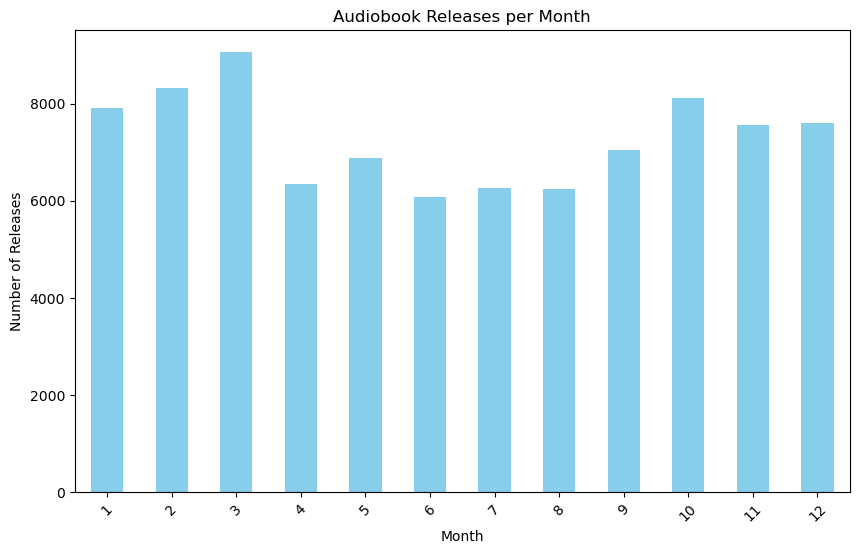

In [51]:

# Plot the results
plt.figure(figsize=(10,6))
df['month'].value_counts().sort_index().plot(kind='bar', color='skyblue').plot(kind='bar', color='skyblue')
plt.title('Audiobook Releases per Month')
plt.xlabel('Month')
plt.ylabel('Number of Releases')
plt.xticks(rotation=45)
plt.show()

# GRAPH_3 '' Average Price of Audiobooks per Month ''

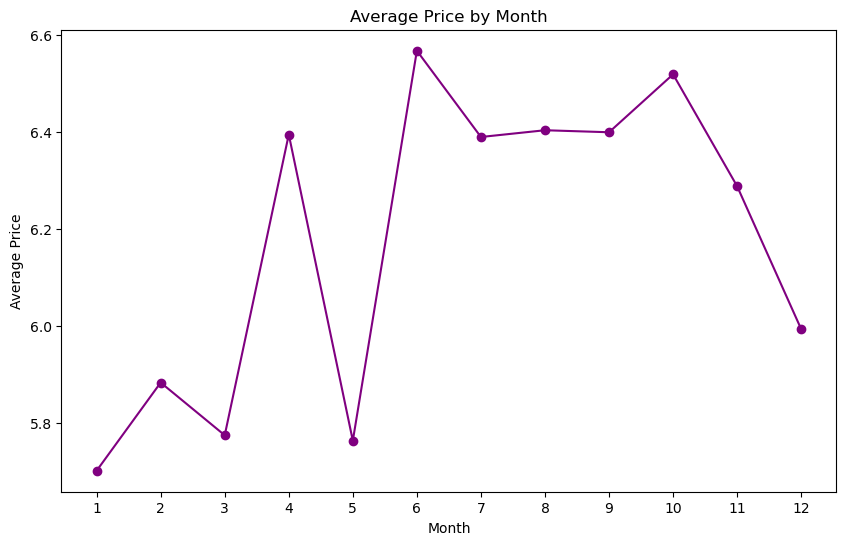

In [52]:
# Average price by month


plt.figure(figsize=(10,6))
df.groupby('month')['price_EUR'].mean().plot(kind='line', marker='o', color='purple')
plt.title('Average Price by Month')
plt.xlabel('Month')
plt.ylabel('Average Price')
plt.xticks(range(1, 13))
plt.show()


INSIGHTS (GRAPH_2 & GRAPH_3) :
    
Upon analyzing the relationship between release dates per month and pricing trends, it becomes evident that as the number of releases per month increases, the price of audiobooks tends to decrease. This observation suggests that during months with a higher volume of audiobook releases, there is greater competition in the market, leading to more competitive pricing strategies.

In these periods, publishers or distributors might opt to lower prices to stand out among a larger pool of new releases, aiming to attract more buyers in a crowded market. On the other hand, during months with fewer releases, audiobooks may be priced higher, as there is less competition, allowing sellers to set premium price.

This insight could be valuable for decision-making regarding pricing strategies, especially in planning release schedules to optimize both sales and profitability.
It can be considered to adjusting prices dynamically based on the volume of releases in a given period or exploring promotional strategies during peak release months to maintain competitiveness.

# GRAPH_4 '' Top Languages of Audiobooks ''

In [53]:
# Calculate the top languages covering 90% of the books
language_distribution = df['language'].value_counts()

language_cumulative_percentage = language_distribution.cumsum() / language_distribution.sum() * 100

top_languages = language_cumulative_percentage[language_cumulative_percentage <= 90].index



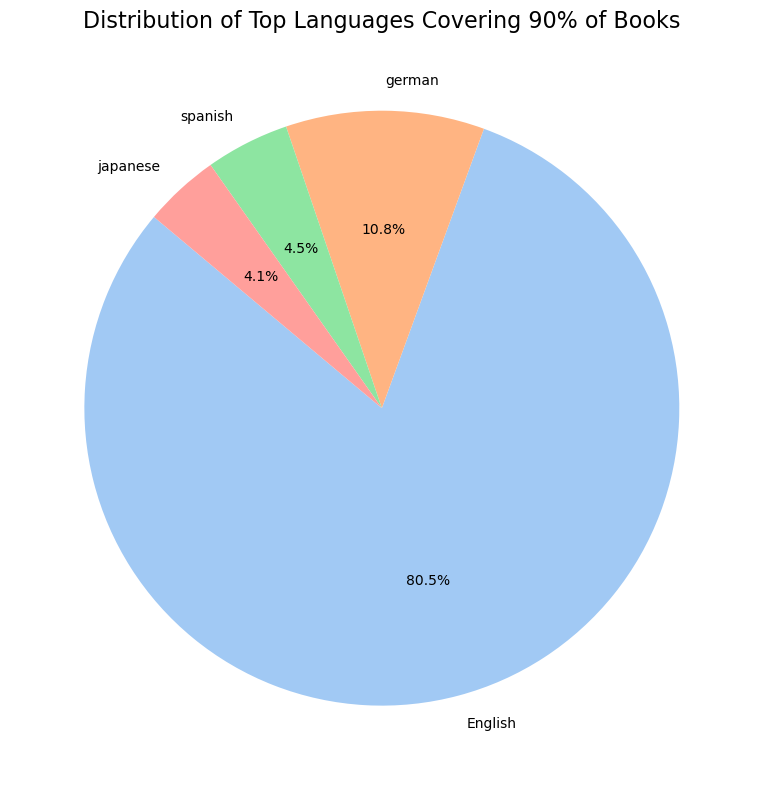

In [54]:
# Generate the counts for the top languages
top_language_counts = df[df['language'].isin(top_languages)]['language'].value_counts()

# Display the top_language_counts to verify the result
top_language_counts

# Create a pie chart for the distribution of the top languages
top_language_counts = df[df['language'].isin(top_languages)]['language'].value_counts()

plt.figure(figsize=(8, 8))
plt.pie(
    top_language_counts, 
    labels=top_language_counts.index, 
    autopct='%1.1f%%', 
    startangle=140, 
    colors=sns.color_palette("pastel", len(top_language_counts))
)
plt.title('Distribution of Top Languages Covering 90% of Books', fontsize=16)
plt.tight_layout()
plt.show()

# GRAPH_5 '' Top 5 Audiobooks published in multiple languages ''

In [55]:
#Recreate the duplicate_details DataFrame with correct aggregation

duplicate_details = df.groupby('name').agg({'language': lambda x: list(x.unique()),  # List unique languages
}).reset_index()

In [56]:
# Add the 'language_count' column to count the number of languages

duplicate_details['language_count'] = duplicate_details['language'].apply(len)

In [57]:
# Find the top 5 books published in the most languages

books_with_most_languages = duplicate_details.nlargest(5, 'language_count')


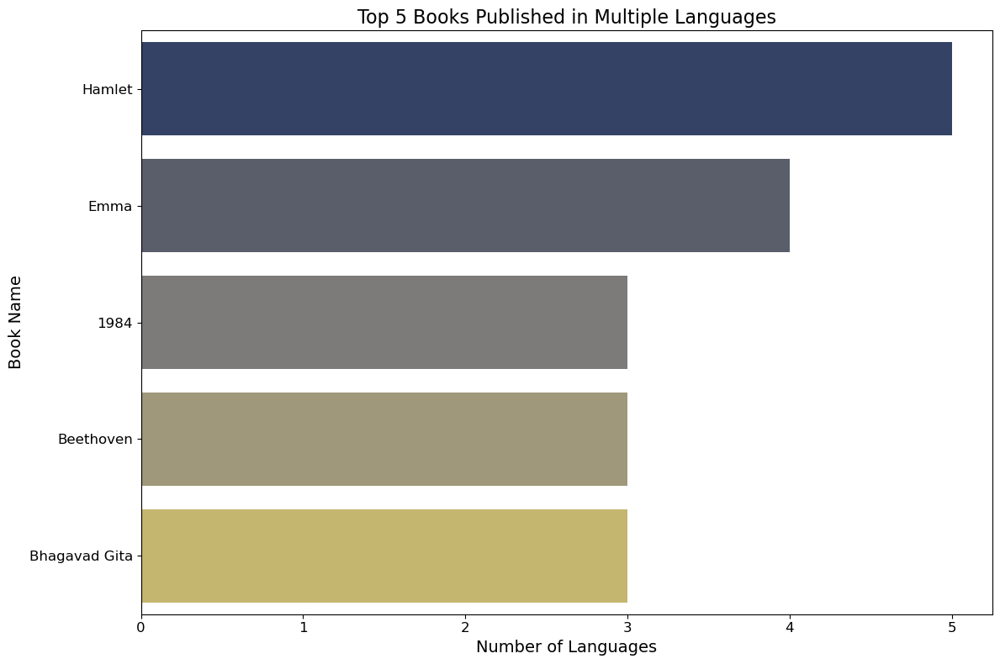

In [58]:
# Visualization: Top 5 Books Published in Multiple Languages

plt.figure(figsize=(12, 8))
sns.barplot(
    x='language_count', 
    y='name', 
    data=books_with_most_languages, 
    palette="cividis"
)
plt.title('Top 5 Books Published in Multiple Languages', fontsize=16)
plt.xlabel('Number of Languages', fontsize=14)
plt.ylabel('Book Name', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

INSIGHTS (Graph_5)
There are 36 different languages in the Dataset
The top 4 languages cover the 90% of the audiobooks
From the 87,489 audiobooks the 76,842 belong to the top languages

# GRAPHS_6-7 '' Average Price & Distribution of Audiobooks by Language ''

In [59]:
# Filter data for top languages
top_languages_prices = df[df['language'].isin(top_languages)]


In [60]:
# Calculate average and median prices per language
price_stats = top_languages_prices.groupby('language')['price'].agg(['mean', 'median']).sort_values(by='mean', ascending=False)


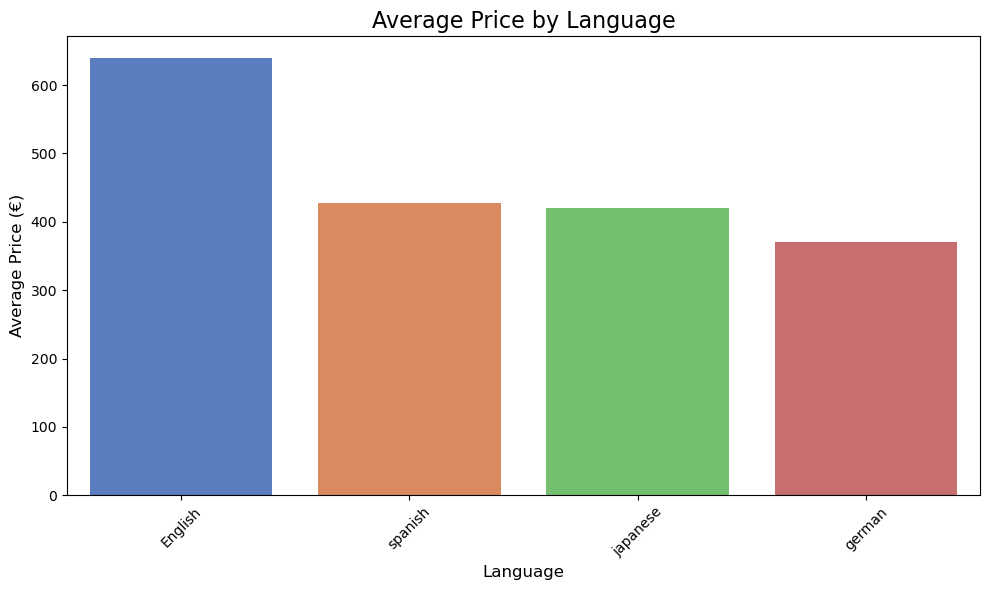

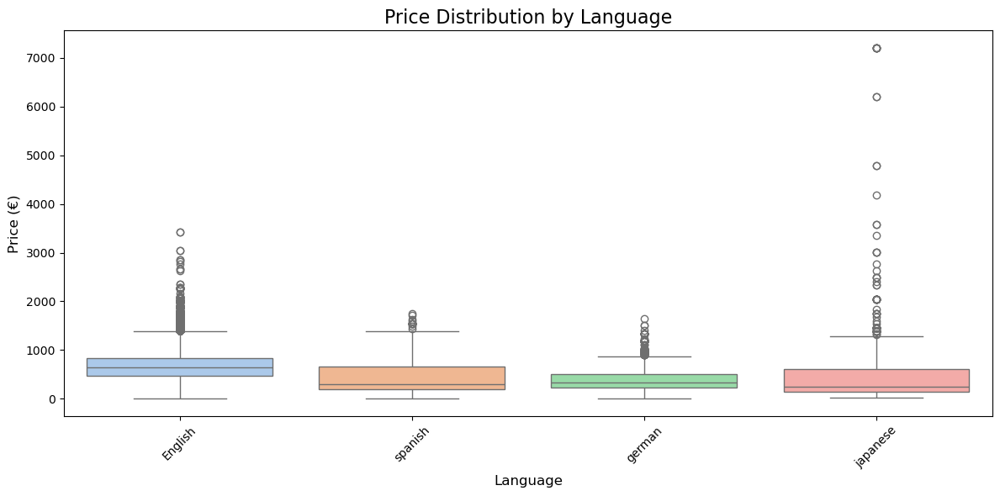

In [61]:
# Plot average price per language
plt.figure(figsize=(10, 6))
sns.barplot(x=price_stats.index, y=price_stats['mean'], palette="muted")
plt.title('Average Price by Language', fontsize=16)
plt.xlabel('Language', fontsize=12)
plt.ylabel('Average Price (€)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Boxplot to show price distribution by language
plt.figure(figsize=(12, 6))
sns.boxplot(data=top_languages_prices, x='language', y='price', palette="pastel")
plt.title('Price Distribution by Language', fontsize=16)
plt.xlabel('Language', fontsize=12)
plt.ylabel('Price (€)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# GRAPH_8 '' Price of Audiobooks vs Duration ''

In [62]:
fig = px.scatter(
    df,
    x="total_mins",
    y="price_EUR",
    color="rating_stars",
    size="total_mins",
    hover_name="name",
    title="Total Minutes vs Price Colored by Stars",
    labels={"total_mins": "Total Minutes", "price_EUR": "Price (€)"}
)
fig.show()

INSIGHTS (GRAPH_8)

Longer durations (higher total minutes) generally correlate with higher prices, as seen with "The Burning Maze" (788 mins, priced at €9,02).
On the other hand,
Shorter audiobooks like "The Deep End" and "Geronimo Stilton #11 & #12" have lower durations (123 and 140 mins) and lower prices (€4.51 and €5.15)

END OF CODE 

In [65]:
from datetime import datetime, timedelta

In [66]:
yesterday = datetime.now() - timedelta(days=1)

In [68]:
print("Creation date:", yesterday.strftime("%Y-%m-%d"))

Creation date: 2024-12-14
